In [2]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
from scipy.signal import convolve2d
from scipy.optimize import minimize

# TP 2-3 Imagerie Computationnelle

En  plus  des  exercices  ci-dessous,  il  vous  est  fortement  conseillé  de  consulter  les  Numerical  
Tours with Matlab (https://www.numerical-tours.com/matlab/) ou with Python 
(https://www.numerical-tours.com/python/),  et  en  particulier  l'implémentation  de  toutes  les méthodes de restauration d'images vues en cours, comme par exemple :
 - Simple Denoising Methods / Linear Image Denoising
 -  Simple Denoising Methods / Denoising by Sobolev and Total Variation Regularization
 -  Wavelet Denoising / Image Denoising with Wavelets
 -  Advanced Denoising Methods / Non-Local Means 
 -  Advanced Denoising Methods / Bilateral Filtering
 -  Sparsity and Redundant Representations / Compressed Sensing of Images
 -  Sparsity and Redundant Representations / Dictionary Learning for Denoising
 -  Inverse Problems / Image Deconvolution using Variational Method
 -  Inverse Problems / Image Deconvolution using Sparse Regularization
 -  Inverse Problems / Reconstruction from Partial Tomography Measurements
 -  Inverse Problems / Tomography Inversion using Tikhonov and Sparse Regularization

## Déconvolution : calculs de base

### 1. Vérification des propriétés du produit de convolution vues en cours à partir des images : 

h = $\begin{bmatrix}1 & 4 & 7 \\ 2 & 5 & 8 \\ 3 & 6 & 9 \end{bmatrix}$

x = round(5 x rand(3,3))

#### a. Calcul du produit de convolution complet dans le domaine spatial.

In [3]:
h = np.array([[1, 4, 7],
              [2, 5, 8],
              [3, 6, 9]])

x = np.round(5 * np.random.rand(3, 3))

In [4]:
def spatial_convolution(image, kernel):
    h, w = image.shape
    kh, kw = kernel.shape
    
    result = np.zeros((h + kh - 1, w + kw - 1))
    
    for i in range(h):
        for j in range(w):
            result[i:i+kh, j:j+kw] += image[i, j] * kernel
            
    return result

In [5]:
print("Image x :")
print(x)
print("\nNoyau h :")
print(h)
print("\nRésultat de la convolution :")
spatial_convolution_var = spatial_convolution(x, h)
print(spatial_convolution_var)

Image x :
[[3. 2. 0.]
 [2. 5. 5.]
 [2. 4. 1.]]

Noyau h :
[[1 4 7]
 [2 5 8]
 [3 6 9]]

Résultat de la convolution :
[[  3.  14.  29.  14.   0.]
 [  8.  32.  73.  71.  35.]
 [ 15.  56. 121. 115.  47.]
 [ 10.  45. 101. 112.  53.]
 [  6.  24.  45.  42.   9.]]


#### b. Calculer le produit de convolution complet dans le domaine fréquentiel. 

In [6]:
def frequency_convolution(image, kernel):
    h, w = image.shape
    kh, kw = kernel.shape
    
    padded_image = np.pad(image, ((0, kh-1), (0, kw-1)))
    padded_kernel = np.pad(kernel, ((0, h-1), (0, w-1)))
    
    print("Original image padded : \n", padded_image)
    print("Original kernel padded : \n", padded_kernel)
    
    F_image = np.fft.fft2(padded_image)
    F_kernel = np.fft.fft2(padded_kernel)
    
    F_result = F_image * F_kernel
    
    result = np.real(np.fft.ifft2(F_result))
    
    return result

In [7]:
print("Image x :")
print(x)
print("\nNoyau h :")
print(h)
print("\nRésultat de la convolution dans le domaine fréquentiel :")
frequency_convolution_var = frequency_convolution(x, h)
print(frequency_convolution_var)

Image x :
[[3. 2. 0.]
 [2. 5. 5.]
 [2. 4. 1.]]

Noyau h :
[[1 4 7]
 [2 5 8]
 [3 6 9]]

Résultat de la convolution dans le domaine fréquentiel :
Original image padded : 
 [[3. 2. 0. 0. 0.]
 [2. 5. 5. 0. 0.]
 [2. 4. 1. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]]
Original kernel padded : 
 [[1 4 7 0 0]
 [2 5 8 0 0]
 [3 6 9 0 0]
 [0 0 0 0 0]
 [0 0 0 0 0]]
[[3.00000000e+00 1.40000000e+01 2.90000000e+01 1.40000000e+01
  2.13162821e-15]
 [8.00000000e+00 3.20000000e+01 7.30000000e+01 7.10000000e+01
  3.50000000e+01]
 [1.50000000e+01 5.60000000e+01 1.21000000e+02 1.15000000e+02
  4.70000000e+01]
 [1.00000000e+01 4.50000000e+01 1.01000000e+02 1.12000000e+02
  5.30000000e+01]
 [6.00000000e+00 2.40000000e+01 4.50000000e+01 4.20000000e+01
  9.00000000e+00]]


In [8]:
comparison = np.isclose(spatial_convolution_var, frequency_convolution_var)
print(spatial_convolution_var, "\n", frequency_convolution_var)
print("Comparison matrix (True indicates similarity):")
print(comparison)
# print(spatial_convolution_var == frequency_convolution_var)
# print(np.array_equal(spatial_convolution_var, frequency_convolution_var))

[[  3.  14.  29.  14.   0.]
 [  8.  32.  73.  71.  35.]
 [ 15.  56. 121. 115.  47.]
 [ 10.  45. 101. 112.  53.]
 [  6.  24.  45.  42.   9.]] 
 [[3.00000000e+00 1.40000000e+01 2.90000000e+01 1.40000000e+01
  2.13162821e-15]
 [8.00000000e+00 3.20000000e+01 7.30000000e+01 7.10000000e+01
  3.50000000e+01]
 [1.50000000e+01 5.60000000e+01 1.21000000e+02 1.15000000e+02
  4.70000000e+01]
 [1.00000000e+01 4.50000000e+01 1.01000000e+02 1.12000000e+02
  5.30000000e+01]
 [6.00000000e+00 2.40000000e+01 4.50000000e+01 4.20000000e+01
  9.00000000e+00]]
Comparison matrix (True indicates similarity):
[[ True  True  True  True  True]
 [ True  True  True  True  True]
 [ True  True  True  True  True]
 [ True  True  True  True  True]
 [ True  True  True  True  True]]


#### c. Calcul  du  produit  de  convolution  circulaire  en  utilisant  la  fonction  imfilter.  Le résultat est de même taille que x. 

In [9]:
def circular_convolution_imfilter(image, kernel):
    result = convolve2d(image, kernel, boundary='wrap', mode='same')
    return result

print("Image x :")
print(x)
print("\nNoyau h :")
print(h)
print("\nRésultat de la convolution circulaire :")
print(circular_convolution_imfilter(x, h))

Image x :
[[3. 2. 0.]
 [2. 5. 5.]
 [2. 4. 1.]]

Noyau h :
[[1 4 7]
 [2 5 8]
 [3 6 9]]

Résultat de la convolution circulaire :
[[100. 118. 127.]
 [103. 121. 130.]
 [112. 130. 139.]]



#### d. Calcul du produit de convolution circulaire en passant par le domaine de Fourier. Le résultat est de même taille que x.  

In [10]:
def circular_convolution_fourier(image, kernel):
    H = np.zeros_like(image)
    H[:kernel.shape[0], :kernel.shape[1]] = kernel
    H = np.roll(H, -int(kernel.shape[0]/2), axis=0)
    H = np.roll(H, -int(kernel.shape[1]/2), axis=1)
    H = np.fft.fft2(H)
    result = np.real(np.fft.ifft2(np.fft.fft2(image) * H))
    return result

print("Image x :")
print(x)
print("\nNoyau h :")
print(h)
print("\nRésultat de la convolution circulaire dans le domaine de Fourier :")
circular_convolution_fourier_var = circular_convolution_fourier(x, h)
print(circular_convolution_fourier_var)

Image x :
[[3. 2. 0.]
 [2. 5. 5.]
 [2. 4. 1.]]

Noyau h :
[[1 4 7]
 [2 5 8]
 [3 6 9]]

Résultat de la convolution circulaire dans le domaine de Fourier :
[[100. 118. 127.]
 [103. 121. 130.]
 [112. 130. 139.]]



#### e. Obtention du résultat en c. en définissant une matrice BCCB H à partir de h et en multipliant cette matrice par la version vectorisée de l'image x.

In [11]:
def circulant_vector(v):
    n = len(v)
    return np.array([np.roll(v, i) for i in range(n)]).T

def construct_BCCB(h):
    length = h.shape[0]
    h = np.roll(h, -1, axis=0)
    h = np.roll(h, -1, axis=1)
    blocks = h.T.flatten()
    blocks = np.split(blocks, length)

    block_circulants = np.array([circulant_vector(blocks[i]) for i in range(length)])
    BCCB_matrix = np.vstack([
        np.hstack([np.roll(block_circulants, i, axis=0)[j] for i in range(length)])
        for j in range(length)
    ])
    
    return BCCB_matrix

print("Image x :")
print(x)
print("\nNoyau h :")
print(h)
print("\n", "Résultat de la convolution circulaire en utilisant la matrice BCCB H :")
bccb_H = construct_BCCB(h)
print(bccb_H)


x_vectorized = x.flatten() 
result = np.dot(bccb_H, x_vectorized) 
print("\n", result)

Image x :
[[3. 2. 0.]
 [2. 5. 5.]
 [2. 4. 1.]]

Noyau h :
[[1 4 7]
 [2 5 8]
 [3 6 9]]

 Résultat de la convolution circulaire en utilisant la matrice BCCB H :
[[5 4 6 2 1 3 8 7 9]
 [6 5 4 3 2 1 9 8 7]
 [4 6 5 1 3 2 7 9 8]
 [8 7 9 5 4 6 2 1 3]
 [9 8 7 6 5 4 3 2 1]
 [7 9 8 4 6 5 1 3 2]
 [2 1 3 8 7 9 5 4 6]
 [3 2 1 9 8 7 6 5 4]
 [1 3 2 7 9 8 4 6 5]]

 [100. 106. 109. 109. 115. 118. 136. 142. 145.]


## Problèmes inverses à la déconvolution et ses solutions

Nous examinons le modèle de formation d'image suivant :
$$
i(x, y) = h(x, y) * i_{\text{ideal}}(x, y) + b(x, y)
$$

Avec $ * $ représente le produit de convolution circulaire et $ b(x, y) $ représente un bruit gaussien. Généralement, $ h(x, y) $ est un noyau qui induit un flou dans l'image. Dans ce cas suit, nous supposerons que $ h(x, y) $ est connu. L’objectif est donc de retrouver $ i_{\text{ideal}}(x, y) $ à partir de $ i(x, y) $.

### A. Modèle direct : calculer l'image floue et bruitée à partir d'une image parfaite

Visualisez-les. Pour chaque cas, l’image constituera par la suite $ i_{\text{ideal}}(x, y) $.

1. Chargez une image de votre choix, ou l’image `coat_of_arms.png` (à télécharger ici : http://www.ogemarques.com/wp-content/uploads/2014/11/Tutorial_Images.zip)


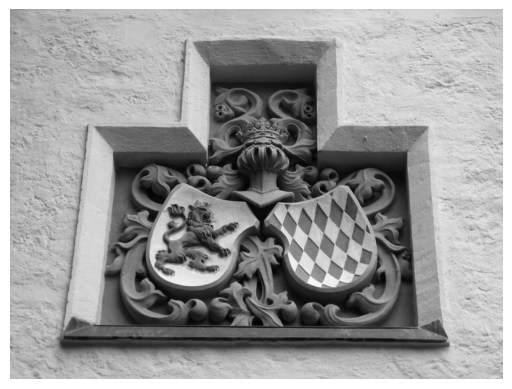

In [12]:
image_path = 'data/coat_of_arms.png'
img = mpimg.imread(image_path)

plt.imshow(img, cmap='gray')
plt.axis('off')
plt.show()


2. Créez une image constante par morceaux

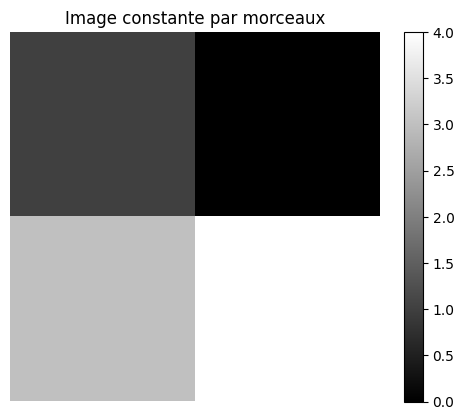

In [13]:
image_constante = np.zeros((256, 256))

half = int(len(image_constante)/2)


image_constante[0:half, 0:half] = 1
image_constante[0:half, half:6] = 2
image_constante[half:half*2, 0:half] = 3
image_constante[half:half*2, half:half*2] = 4

plt.imshow(image_constante, cmap='gray', interpolation='nearest')
plt.colorbar()
plt.title("Image constante par morceaux")
plt.axis('off')
plt.show()


3. Créez une image sparse.


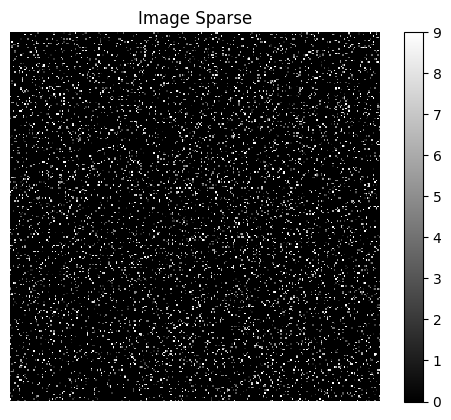

In [14]:
taille_image = (256, 256)

image_sparse = np.zeros(taille_image)

nombre_valeurs_non_nulles = len(image_sparse.flatten()) // 10

positions = np.random.choice(taille_image[0] * taille_image[1], nombre_valeurs_non_nulles, replace=False)

for pos in positions:
    row = pos // taille_image[1]
    col = pos % taille_image[1]
    image_sparse[row, col] = np.random.randint(1, 10)

plt.imshow(image_sparse, cmap='gray', interpolation='nearest')
plt.colorbar()  
plt.title("Image Sparse")
plt.axis('off')
plt.show()


### B. Pour chaque image, vous devez :

1. Générer et visualiser :\
   a. Générer l’image $ i(x, y) $, en considérant $ h(x, y) $ un filtre Gaussien de taille 15x15, l’image sera bruitée avec un bruit additif Gaussien, de puissance telle que le RSB soit de 40 dB.\
   b. Visualiser la transformée de Fourier de $ i_{\text{ideal}} $, de $ i(x, y) $ et de $ h(x, y) $. Commenter les trois résultats.
2. Estimer l’image par une régularisation Tikhonov (norme L2).

In [15]:
def show_fft(image):
    f = np.fft.fft2(image)
    fshift = np.fft.fftshift(f)
    magnitude_spectrum = 20 * np.log(np.abs(fshift))
    return magnitude_spectrum

EQM0 :  0.0041002699849209834
EQM1 :  0.003116927338724146
PSNR0 :  72.00267906806468
PSNR1 :  73.19353682671587


C:\Users\norph\AppData\Local\Temp\ipykernel_18872\3101974371.py:4: RuntimeWarning: divide by zero encountered in log
  magnitude_spectrum = 20 * np.log(np.abs(fshift))


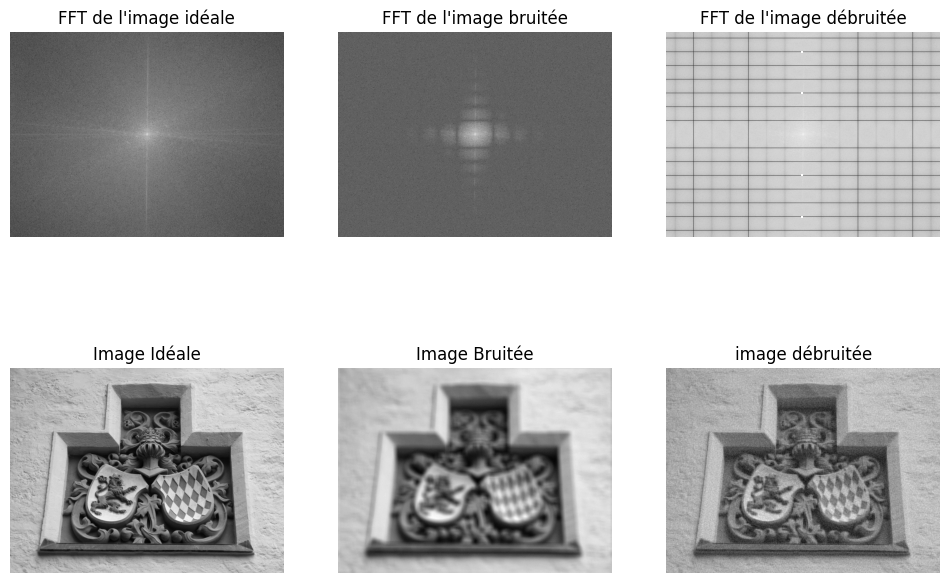

EQM0 :  0.10740475624669016
EQM1 :  0.04990922486482907
PSNR0 :  57.820568470466895
PSNR1 :  61.14899535933497


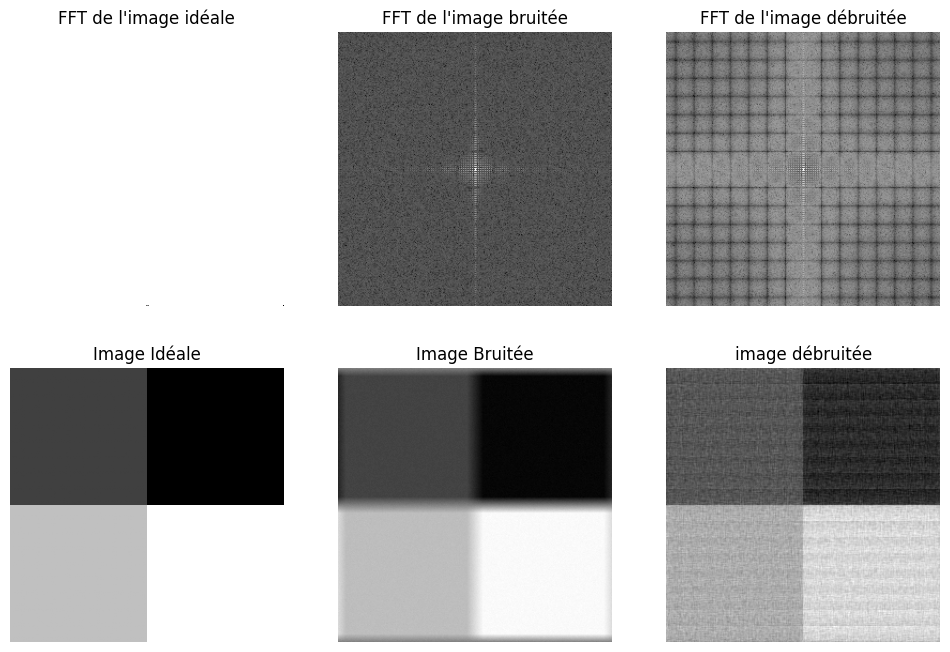

EQM0 :  2.9632689131630983
EQM1 :  2.372511876810584
PSNR0 :  43.413092958868404
PSNR1 :  44.378719656820095


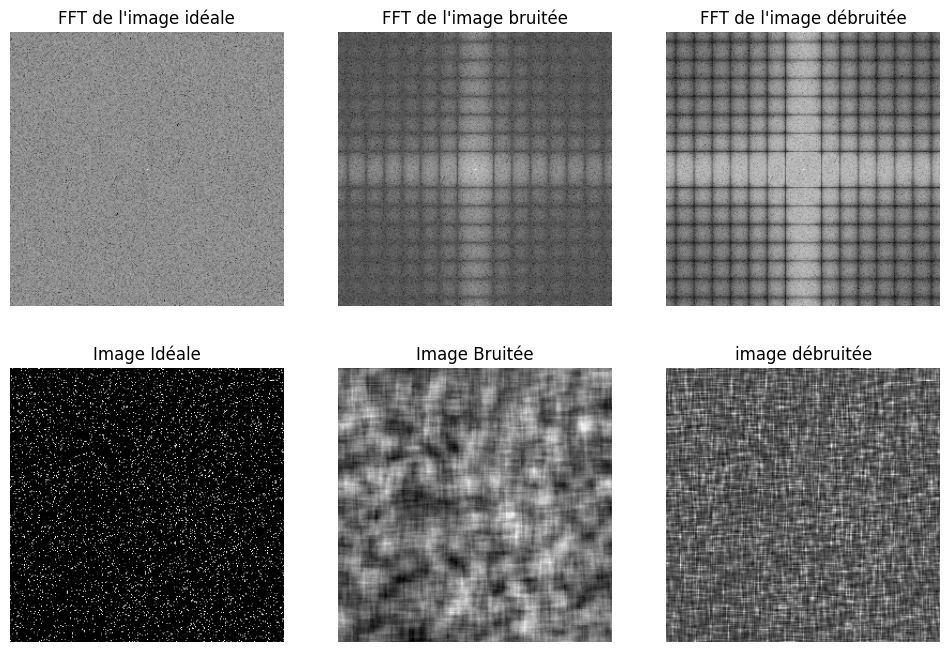

In [16]:
images = [img, image_constante, image_sparse]
h = np.ones((15, 15))/(15.0*15.0)


for i_ideal in images:
    taille_image = i_ideal.shape

    H = np.zeros_like(i_ideal)
    H[:h.shape[0], :h.shape[1]] = h
    H = np.roll(H, -int(h.shape[0]/2.0), axis=0)
    H = np.roll(H, -int(h.shape[1]/2.0), axis=1)
    
    D = np.fft.fft2(H)
    DT = np.conj(D)
    
    my_conv = np.real(np.fft.ifft2(D * np.fft.fft2(i_ideal)))
    
    SNRdb = 40
    SNR = (10 ** (SNRdb / 10))
    ps_in = np.sum(np.sum(my_conv ** 2)) / (my_conv.shape[0] * my_conv.shape[1])
    pb_norm = ps_in / SNR
    Mnoise = np.sqrt(pb_norm) * np.random.randn(my_conv.shape[0], my_conv.shape[1])
    MCB = my_conv + Mnoise
    
    alpha_regularisation = 0.001
    i_ideal_est = np.real(np.fft.ifft2(1/(DT*D + alpha_regularisation) * DT * np.fft.fft2(MCB)))
    
    EQM0 = np.mean(np.square(MCB - i_ideal))
    EQM1 = np.mean(np.square(i_ideal_est - i_ideal))
    
    print("EQM0 : ", EQM0)
    print("EQM1 : ", EQM1)
    
    PSNR0 = 20 * np.log10(255.0 / np.sqrt(EQM0))
    PSNR1 = 20 * np.log10(255.0 / np.sqrt(EQM1))
    
    print("PSNR0 : ", PSNR0)
    print("PSNR1 : ", PSNR1)
    
    col = 3
    plt.figure(figsize=(12, 16))
    plt.subplot(1, col, 1)
    plt.title("Image Idéale")
    plt.imshow(i_ideal, cmap='gray')
    plt.axis('off')

    plt.subplot(1, col, 2)
    plt.title("Image Bruitée")
    plt.imshow(MCB, cmap='gray')
    plt.axis('off')

    plt.subplot(1, col, 3)
    plt.title("image débruitée")
    plt.imshow(i_ideal_est, cmap='gray')
    plt.axis('off')
    
    plt.subplot(2, col, 1)
    plt.title("FFT de l'image idéale")
    plt.imshow(show_fft(i_ideal), cmap='gray')
    plt.axis('off')
    
    plt.subplot(2, col, 2)
    plt.title("FFT de l'image bruitée")
    plt.imshow(show_fft(MCB), cmap='gray')
    plt.axis('off')
    
    plt.subplot(2, col, 3)
    plt.title("FFT de l'image débruitée")
    plt.imshow(show_fft(i_ideal_est), cmap='gray')
    plt.axis('off')

    plt.show()



3. Faire varier le paramètre de régularisation. Commenter les résultats.

Le choix du paramètre de régularisation alpha dépend d'un compromis entre la réduction du bruit et les détails de l'image. Donc une valeur alpha trop faible peut laisser un peu de bruit, tandis qu'une valeur trop élevée peut entraîner une perte de détails. dans notre cas le alpha a 0.001 a l'air d'etre un bon compromis.

Alpha : 0.0001
EQM : 0.037516953174880366
PSNR : 62.38852799632791 

Alpha : 0.001
EQM : 0.0031016662661001097
PSNR : 73.21485294208006 

Alpha : 0.01
EQM : 0.001873984027955338
PSNR : 75.40314475810506 

Alpha : 0.1
EQM : 0.006144017910727146
PSNR : 70.24627887809521 

Alpha : 1
EQM : 0.099897684620619
PSNR : 58.13524938389093 



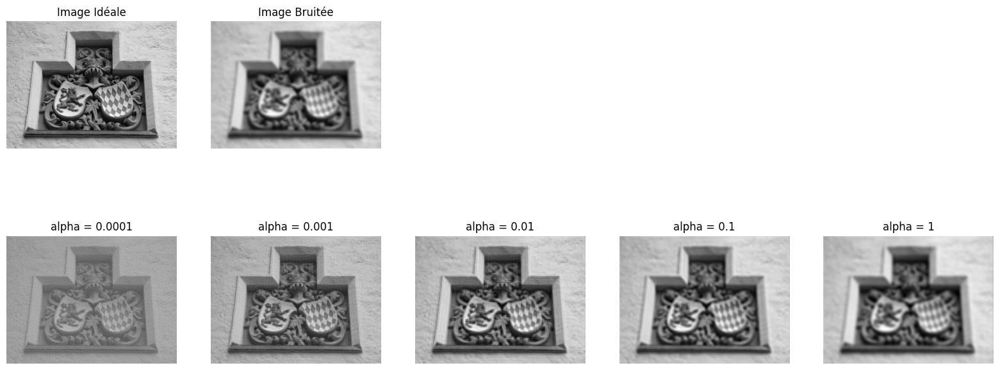

Alpha : 0.0001
EQM : 0.6240740858166217
PSNR : 50.17844211647876 

Alpha : 0.001
EQM : 0.049166891121423716
PSNR : 61.21407612644782 

Alpha : 0.01
EQM : 0.03335837251455935
PSNR : 62.898755067075996 

Alpha : 0.1
EQM : 0.12445306089752378
PSNR : 57.180747784081774 

Alpha : 1
EQM : 1.732654145890954
PSNR : 45.743684787777816 



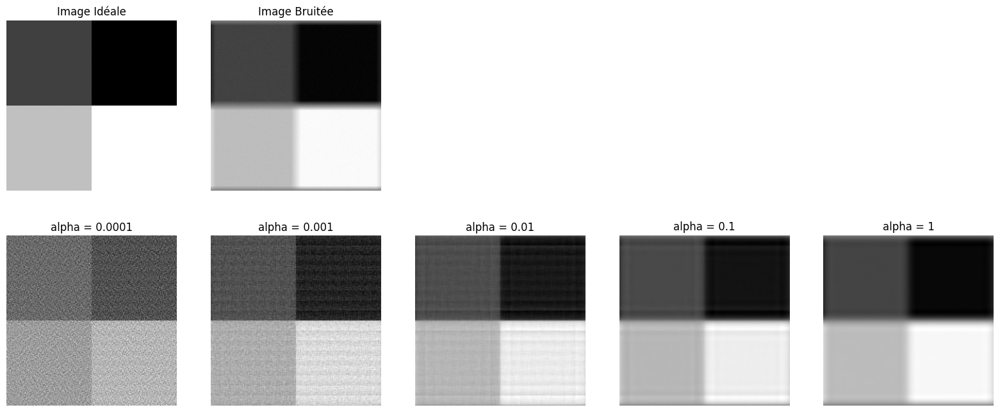

Alpha : 0.0001
EQM : 1.757912258665885
PSNR : 45.68083166198526 

Alpha : 0.001
EQM : 2.3731544382861354
PSNR : 44.37754359054702 

Alpha : 0.01
EQM : 2.73763288084048
PSNR : 43.75705152466245 

Alpha : 0.1
EQM : 2.911102954482006
PSNR : 43.49022795836946 

Alpha : 1
EQM : 3.0253302424977027
PSNR : 43.323075720724084 



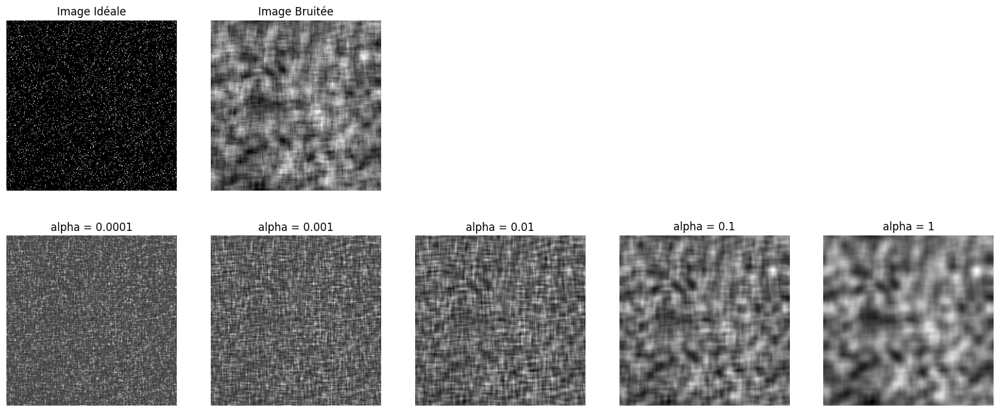

In [17]:
images = [img, image_constante, image_sparse]
h = np.ones((15, 15))/(15.0*15.0)
alpha_values = [0.0001, 0.001, 0.01, 0.1, 1]

for i_ideal in images:
    taille_image = i_ideal.shape

    H = np.zeros_like(i_ideal)
    H[:h.shape[0], :h.shape[1]] = h
    H = np.roll(H, -int(h.shape[0]/2.0), axis=0)
    H = np.roll(H, -int(h.shape[1]/2.0), axis=1)
    
    D = np.fft.fft2(H)
    DT = np.conj(D)
    
    my_conv = np.real(np.fft.ifft2(D * np.fft.fft2(i_ideal)))
    
    SNRdb = 40
    SNR = (10 ** (SNRdb / 10))
    ps_in = np.sum(np.sum(my_conv ** 2)) / (my_conv.shape[0] * my_conv.shape[1])
    pb_norm = ps_in / SNR
    Mnoise = np.sqrt(pb_norm) * np.random.randn(my_conv.shape[0], my_conv.shape[1])
    MCB = my_conv + Mnoise
    
    plt.figure(figsize=(24, 16))
    plt.subplot(2, len(alpha_values) + 1, 1)
    plt.imshow(i_ideal, cmap='gray')
    plt.title("Image Idéale")
    plt.axis('off')
    plt.subplot(2, len(alpha_values) + 1, 2)
    plt.imshow(MCB, cmap='gray')
    plt.title("Image Bruitée")
    plt.axis('off')
    col = len(alpha_values) + 1
    for i, alpha_regularisation in enumerate(alpha_values):
        i_ideal_est = np.real(np.fft.ifft2(1/(DT*D + alpha_regularisation) * DT * np.fft.fft2(MCB)))
        
        EQM = np.mean(np.square(i_ideal_est - i_ideal))
        PSNR = 20 * np.log10(255.0 / np.sqrt(EQM))
        
        print(f"Alpha : {alpha_regularisation}")
        print(f"EQM : {EQM}")
        print(f"PSNR : {PSNR} \n")
        plt.subplot(1, col, i+1)
        plt.imshow(i_ideal_est, cmap='gray')
        plt.title(f"alpha = {alpha_regularisation}")
        plt.axis('off')
    plt.show()



4. Comparer les résultats avec l’estimation des paramètres de régularisation par les méthodes vues en cours (GCV et ML). Commenter les résultats.

Aprés avoir tester les deux methodes de regularisation, nous pouvons constater sur les image ci-dessous pas de grande difference entre les deux methodes.

c:\Users\norph\AppData\Local\Programs\Python\Python312\Lib\site-packages\scipy\optimize\_numdiff.py:619: ComplexWarning: Casting complex values to real discards the imaginary part
  J_transposed[i] = df / dx
c:\Users\norph\AppData\Local\Programs\Python\Python312\Lib\site-packages\scipy\optimize\_lbfgsb_py.py:433: ComplexWarning: Casting complex values to real discards the imaginary part
  _lbfgsb.setulb(m, x, low_bnd, upper_bnd, nbd, f, g, factr, pgtol, wa,


Meilleur alpha selon GCV : 0.029286650489650148
Meilleur alpha selon ML : 0.029286650395005564


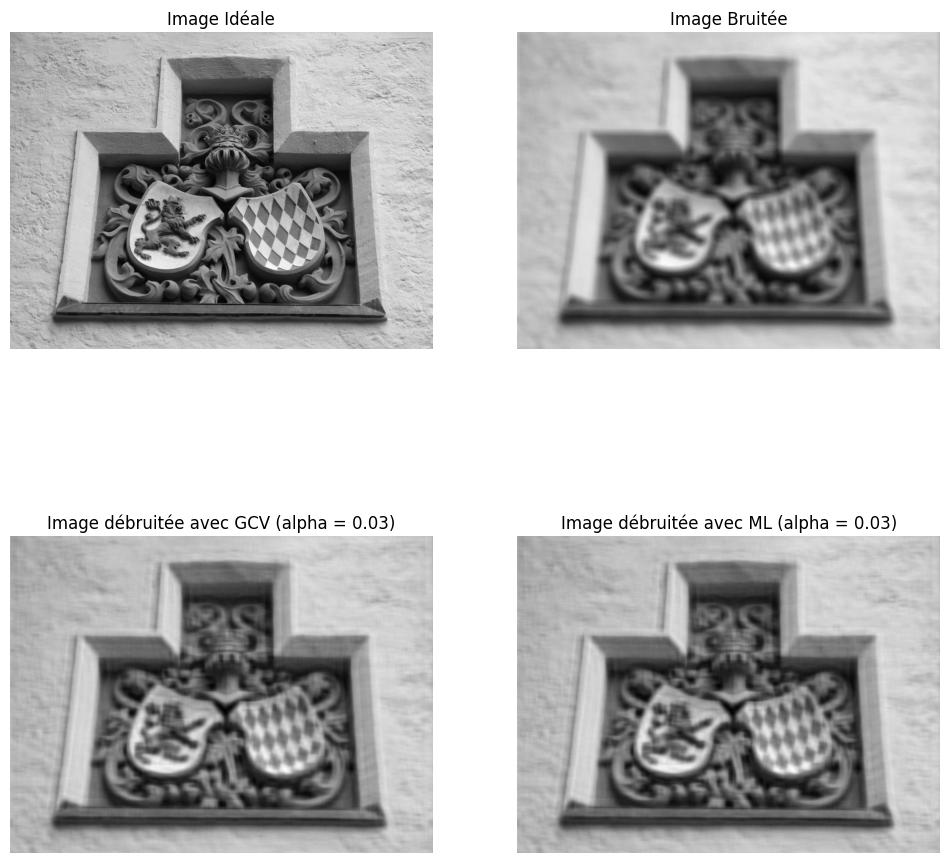

Meilleur alpha selon GCV : 0.040324314338634946
Meilleur alpha selon ML : 0.040324314095455345


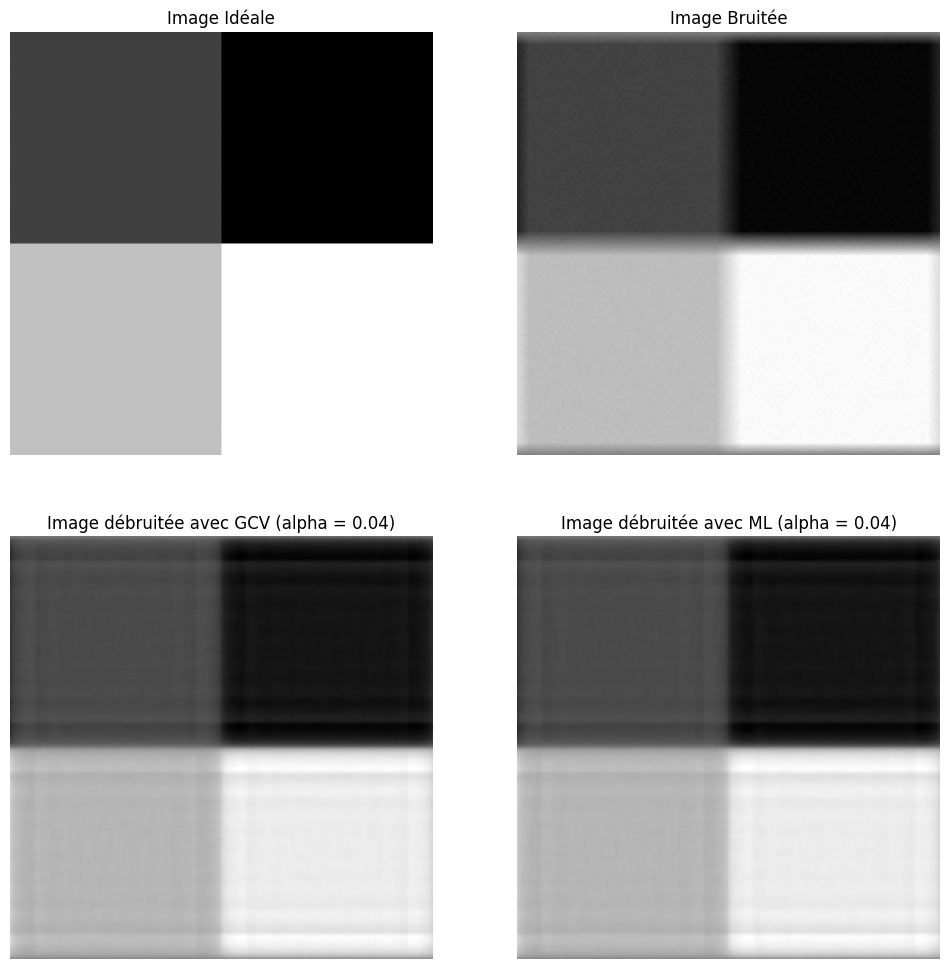

Meilleur alpha selon GCV : 0.12172537991965666
Meilleur alpha selon ML : 0.1217253805179975


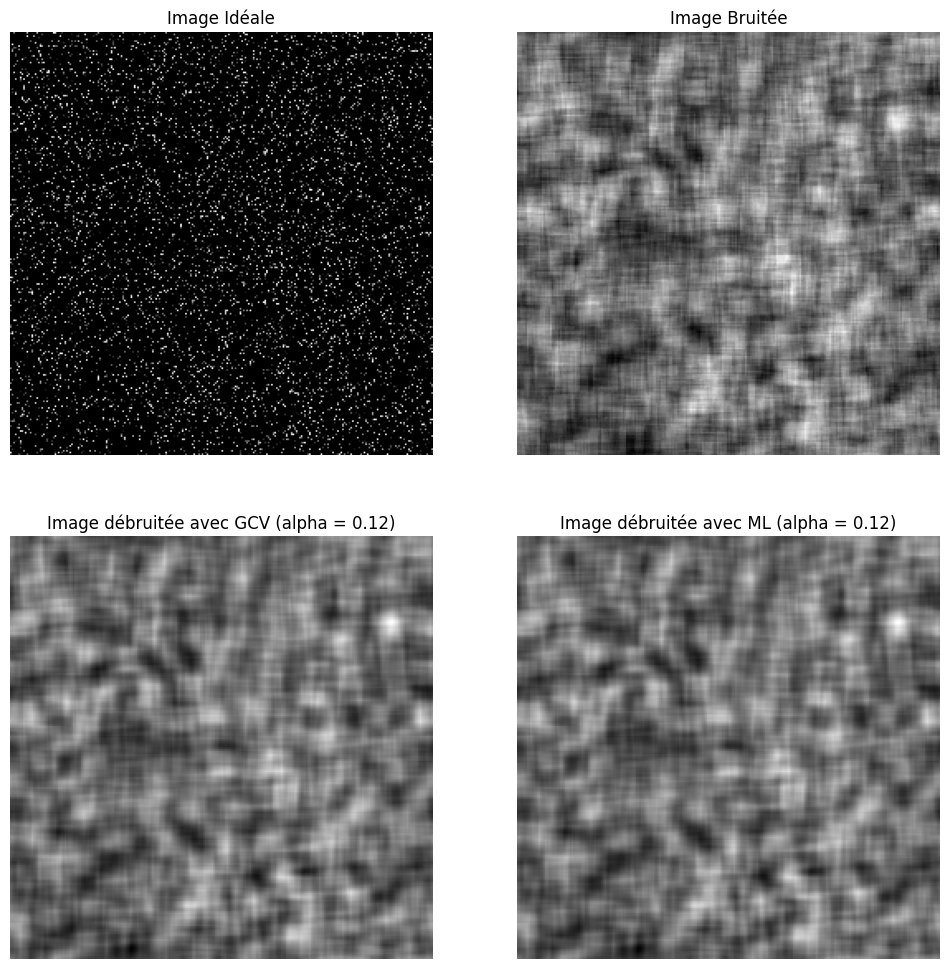

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

images = [img, image_constante, image_sparse]
h = np.ones((15, 15)) / (15.0 * 15.0)

for i_ideal in images:
    taille_image = i_ideal.shape

    H = np.zeros_like(i_ideal)
    H[:h.shape[0], :h.shape[1]] = h
    H = np.roll(H, -int(h.shape[0] / 2.0), axis=0)
    H = np.roll(H, -int(h.shape[1] / 2.0), axis=1)

    D = np.fft.fft2(H)

    my_conv = np.real(np.fft.ifft2(D * np.fft.fft2(i_ideal)))

    SNRdb = 40
    SNR = (10 ** (SNRdb / 10))
    ps_in = np.sum(np.sum(my_conv ** 2)) / (my_conv.shape[0] * my_conv.shape[1])
    pb_norm = ps_in / SNR
    Mnoise = np.sqrt(pb_norm) * np.random.randn(my_conv.shape[0], my_conv.shape[1])
    MCB = my_conv + Mnoise

    D = np.fft.fft2(H)
    DT = np.conj(D)

    plt.figure(figsize=(12, 24))
    plt.subplot(2, 2, 1)
    plt.imshow(i_ideal, cmap='gray')
    plt.title("Image Idéale")
    plt.axis('off')
    plt.subplot(2, 2, 2)
    plt.imshow(MCB, cmap='gray')
    plt.title("Image Bruitée")
    plt.axis('off')

    def gcv(alpha):
        i_ideal_est = np.real(np.fft.ifft2(1 / (DT * D + alpha) * DT * np.fft.fft2(MCB)))
        residual = MCB - i_ideal_est
        return np.sum(residual ** 2) / (len(MCB) - np.trace(DT * D))

    result_gcv = minimize(gcv, x0=0.01, bounds=[(1e-20, 10)])
    best_alpha_gcv = result_gcv.x[0]
    print(f"Meilleur alpha selon GCV : {best_alpha_gcv}")

    def ml(alpha):
        i_ideal_est = np.real(np.fft.ifft2(1 / (DT * D + alpha) * DT * np.fft.fft2(MCB)))
        residual = MCB - i_ideal_est
        return -np.sum(-0.5 * (residual ** 2))

    result_ml = minimize(ml, x0=0.01, bounds=[(1e-20, 10)])
    best_alpha_ml = result_ml.x[0]
    print(f"Meilleur alpha selon ML : {best_alpha_ml}")

    i_ideal_est_gcv = np.real(np.fft.ifft2(1 / (DT * D + best_alpha_gcv) * DT * np.fft.fft2(MCB)))
    plt.subplot(1, 2, 1)
    plt.imshow(i_ideal_est_gcv, cmap='gray')
    plt.title(f"Image débruitée avec GCV (alpha = {best_alpha_gcv:.2f})")
    plt.axis('off')

    i_ideal_est_ml = np.real(np.fft.ifft2(1 / (DT * D + best_alpha_ml) * DT * np.fft.fft2(MCB)))
    plt.subplot(1, 2, 2)
    plt.imshow(i_ideal_est_ml, cmap='gray')
    plt.title(f"Image débruitée avec ML (alpha = {best_alpha_ml:.2f})")
    plt.axis('off')
    plt.show()


5. Faire varier des paramètres du filtre $ h(x,y) $ et le RSB entré et puis commenter les résultats.

Nous avons fait varier les parametres du filtre h(x,y) et le RSB entré, nous avons constaté que plus le filtre h(x,y) est grand plus l'image est floue et plus le RSB est petit plus l'image est bruitée. De plus lors du debruitage de l'image, l'augmentation du filtre $ h(x,y) $ rajoute du bruit lors du debruitage de l'image. alors que plus le RSB est petit plus l'image a du mal a etre debruitée est nous perdons des details de l'image.

Taille du filtre : 5
SNR: 20 dB
EQM0 :  0.00499181125188401
EQM1 :  0.42602192264448296
PSNR0 :  71.14822205230196
PSNR1 :  51.83648412848393


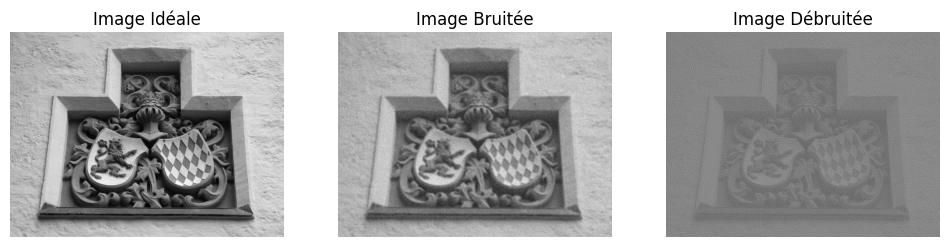

Taille du filtre : 15
SNR: 20 dB
EQM0 :  0.007817553516268099
EQM1 :  0.21292052368726283
PSNR0 :  69.20009497912918
PSNR1 :  54.84862835199765


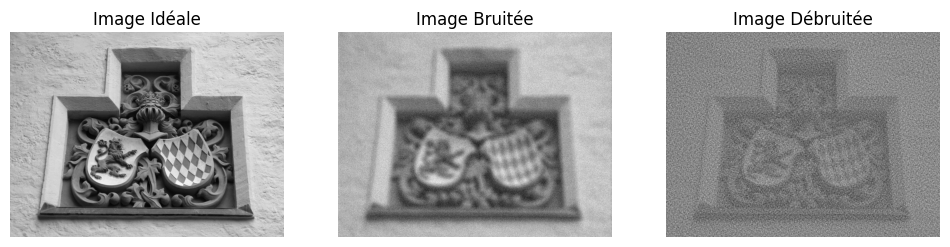

Taille du filtre : 25
SNR: 20 dB
EQM0 :  0.010384886075726942
EQM1 :  0.1128081775316532
PSNR0 :  67.96678624267811
PSNR1 :  57.607397778150386


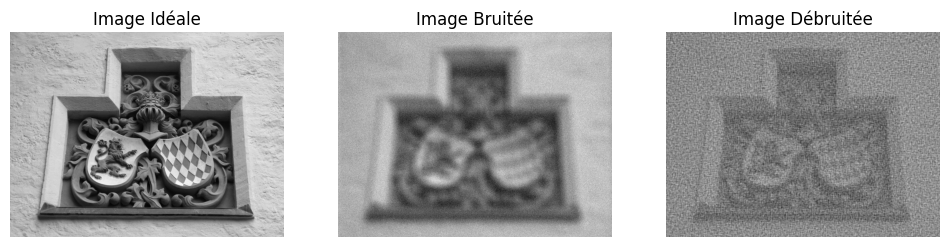

Taille du filtre : 5
SNR: 40 dB
EQM0 :  0.0012228998683876426
EQM1 :  0.004388988538212194
PSNR0 :  77.25689462610868
PSNR1 :  71.70715914175977


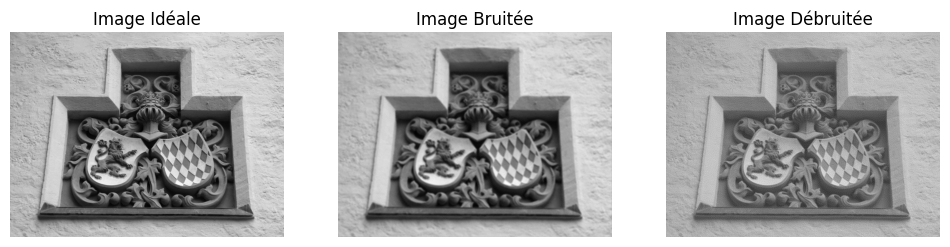

Taille du filtre : 15
SNR: 40 dB
EQM0 :  0.004101191086226729
EQM1 :  0.0031170433717048656
PSNR0 :  72.00170356086525
PSNR1 :  73.19337515613513


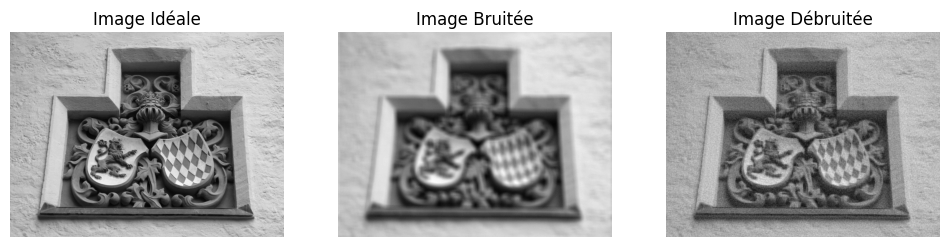

Taille du filtre : 25
SNR: 40 dB
EQM0 :  0.006691896506578842
EQM1 :  0.003012749996573394
PSNR0 :  69.87531145100161
PSNR1 :  73.34117266238492


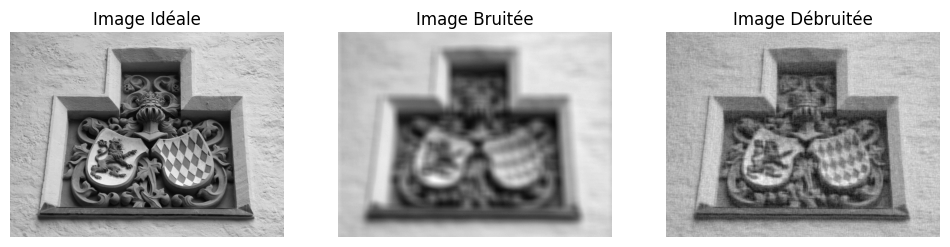

Taille du filtre : 5
SNR: 60 dB
EQM0 :  0.0011846322186444195
EQM1 :  0.0001868841438928525
PSNR0 :  77.39496820821294
PSNR1 :  85.41507905459969


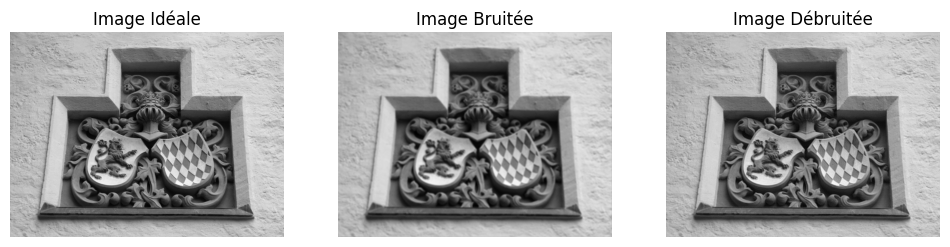

Taille du filtre : 15
SNR: 60 dB
EQM0 :  0.00406399601474855
EQM1 :  0.0009977410770410813
PSNR0 :  72.04127087471369
PSNR1 :  78.1406250835988


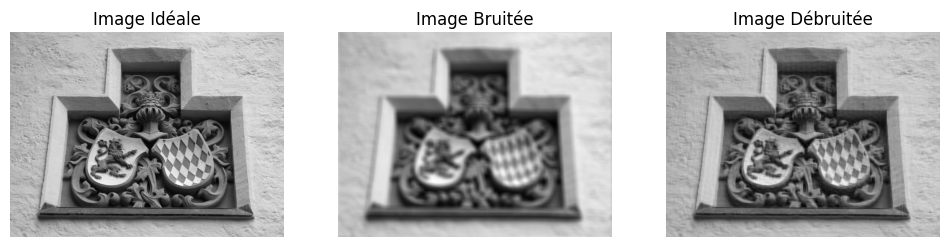

Taille du filtre : 25
SNR: 60 dB
EQM0 :  0.00665251024721112
EQM1 :  0.0019230996094773936
PSNR0 :  69.90094808677357
PSNR1 :  75.2907858119209


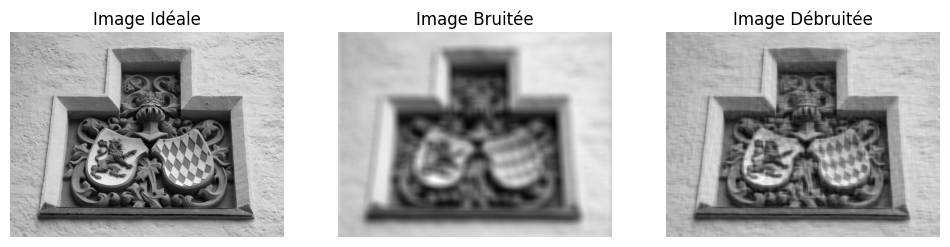

Taille du filtre : 5
SNR: 20 dB
EQM0 :  0.09905898230994375
EQM1 :  7.137785648174225
PSNR0 :  58.1718649895624
PSNR1 :  39.5951685916658


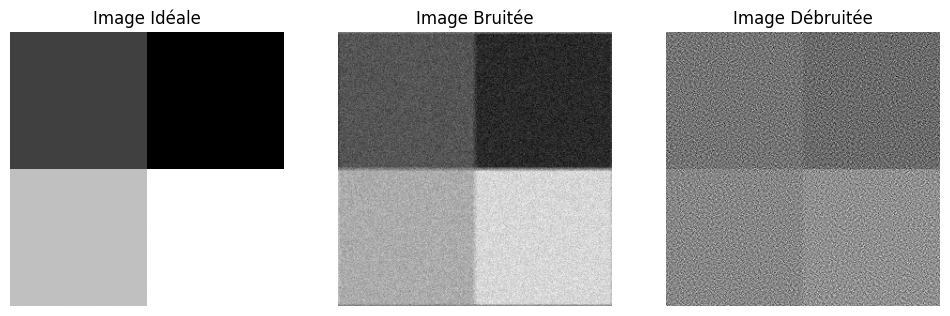

Taille du filtre : 15
SNR: 20 dB
EQM0 :  0.168435123242531
EQM1 :  3.491435905837329
PSNR0 :  55.866477022084915
PSNR1 :  42.70076286994574


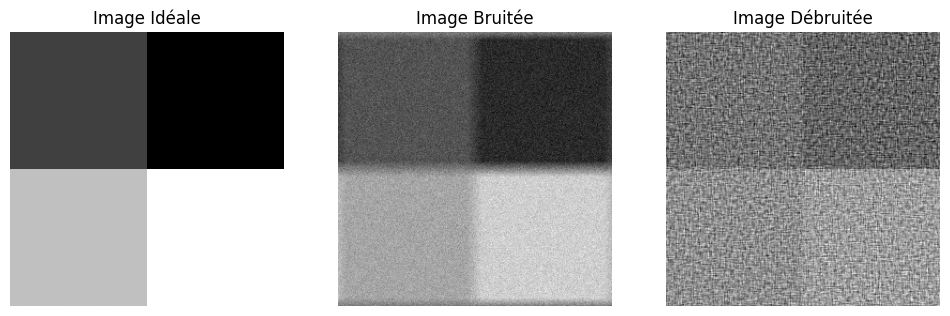

Taille du filtre : 25
SNR: 20 dB
EQM0 :  0.24031512652685144
EQM1 :  1.8570635008936227
PSNR0 :  54.322992527340695
PSNR1 :  45.442536065001356


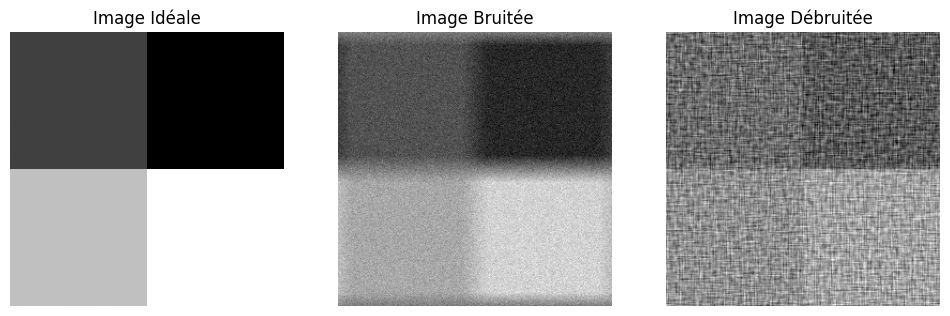

Taille du filtre : 5
SNR: 40 dB
EQM0 :  0.03502265926478599
EQM1 :  0.07388469803960332
PSNR0 :  62.6873124195956
PSNR1 :  59.4452585813049


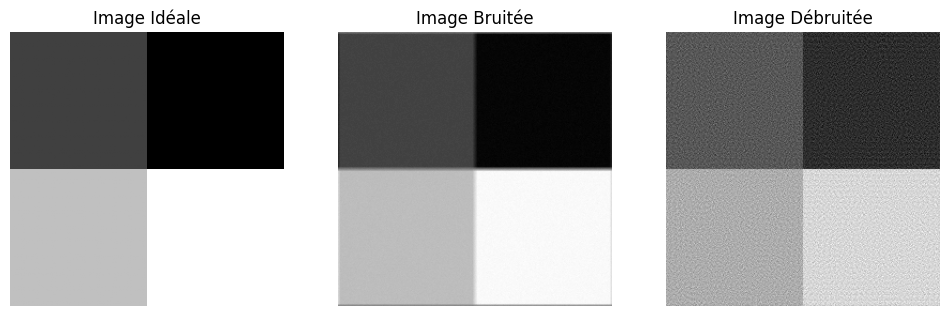

Taille du filtre : 15
SNR: 40 dB
EQM0 :  0.10730030482047785
EQM1 :  0.04917282795443451
PSNR0 :  57.82479405149271
PSNR1 :  61.213551753621886


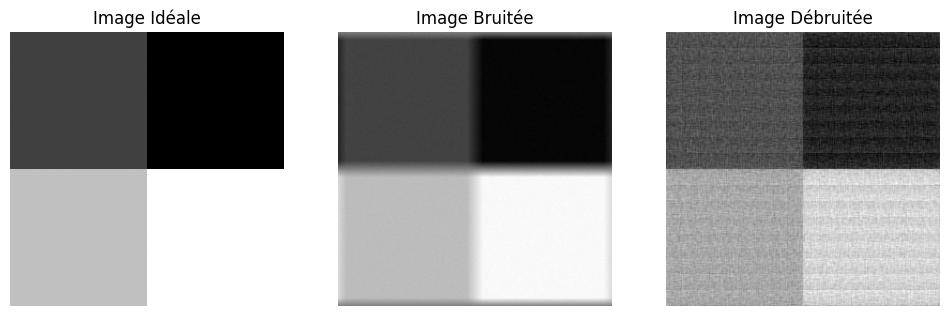

Taille du filtre : 25
SNR: 40 dB
EQM0 :  0.1788008201395961
EQM1 :  0.033143964121301175
PSNR0 :  55.60710854342665
PSNR1 :  62.92675910705882


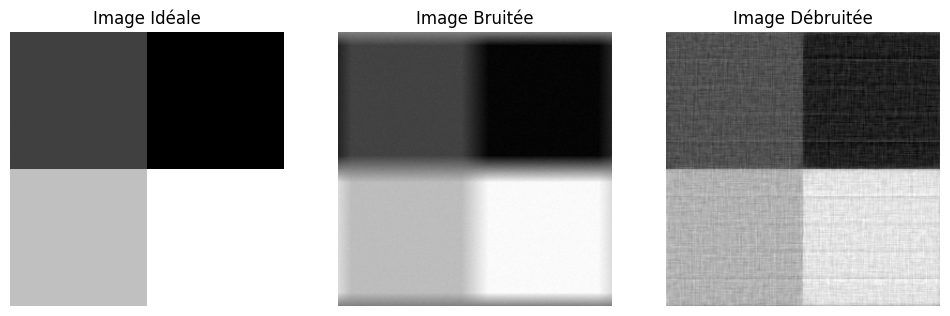

Taille du filtre : 5
SNR: 60 dB
EQM0 :  0.034357472746443796
EQM1 :  0.0027106213006789334
PSNR0 :  62.770591501976526
PSNR1 :  73.80011514078166


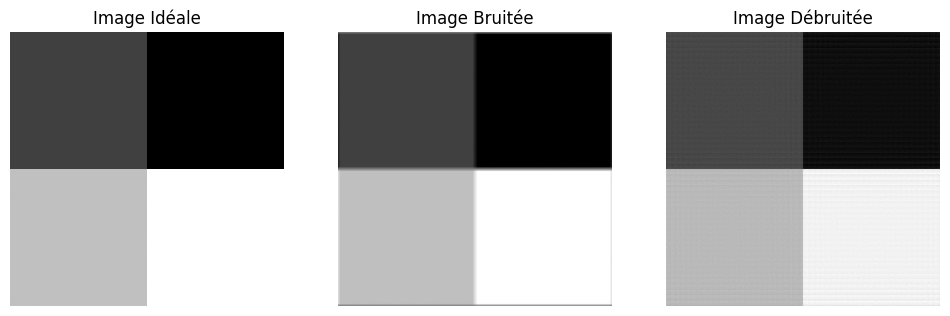

Taille du filtre : 15
SNR: 60 dB
EQM0 :  0.1067674581562493
EQM1 :  0.01401285875346893
PSNR0 :  57.84641457395645
PSNR1 :  66.66553616431163


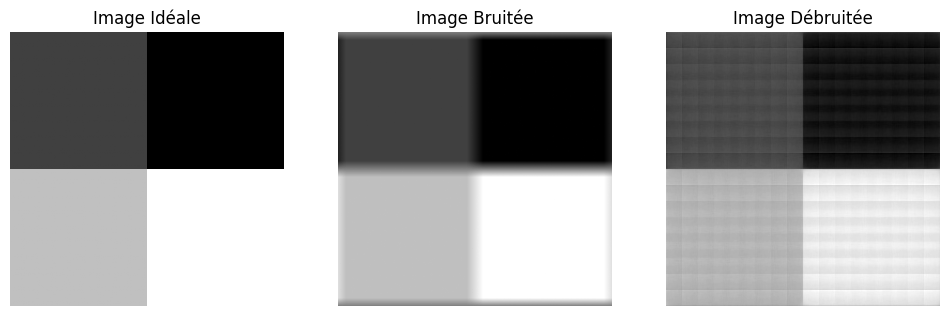

Taille du filtre : 25
SNR: 60 dB
EQM0 :  0.17822335149185944
EQM1 :  0.015022620485573573
PSNR0 :  55.62115754547268
PSNR1 :  66.36334665006737


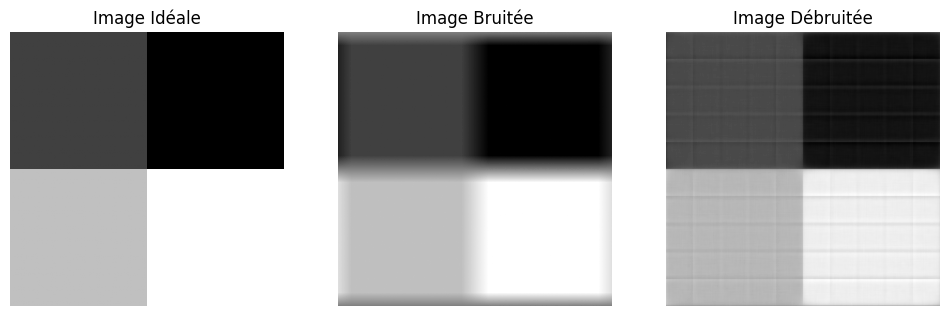

Taille du filtre : 5
SNR: 20 dB
EQM0 :  2.8602781207170436
EQM1 :  1.3511171913437265
PSNR0 :  43.566720968227266
PSNR1 :  46.82387340974977


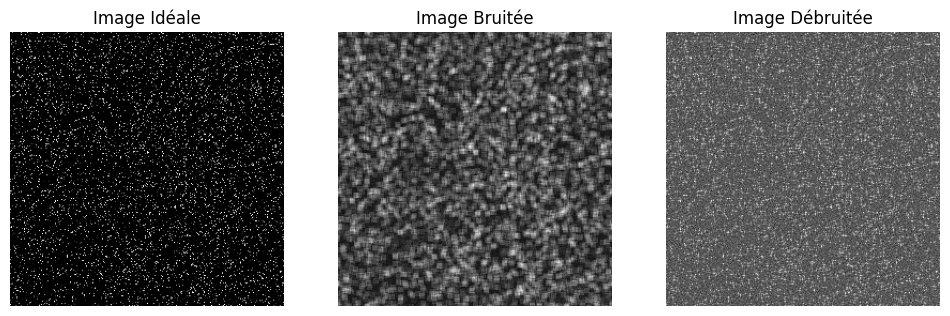

Taille du filtre : 15
SNR: 20 dB
EQM0 :  2.9663805332357356
EQM1 :  2.5257798395361357
PSNR0 :  43.40853498435884
PSNR1 :  44.106848684259546


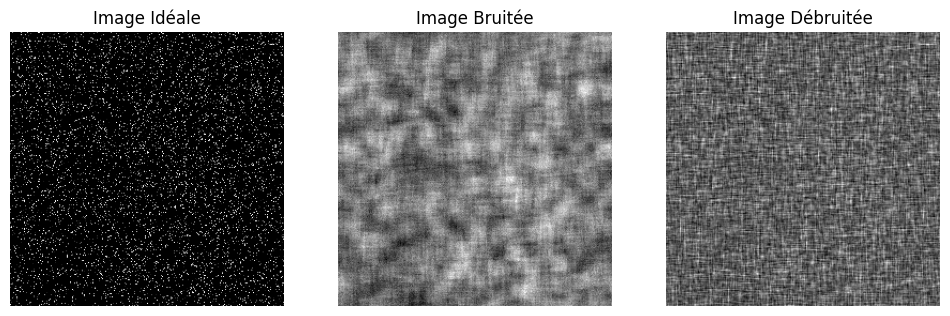

Taille du filtre : 25
SNR: 20 dB
EQM0 :  2.9773013199968807
EQM1 :  2.7711506465996587
PSNR0 :  43.39257570900482
PSNR1 :  43.704202251222775


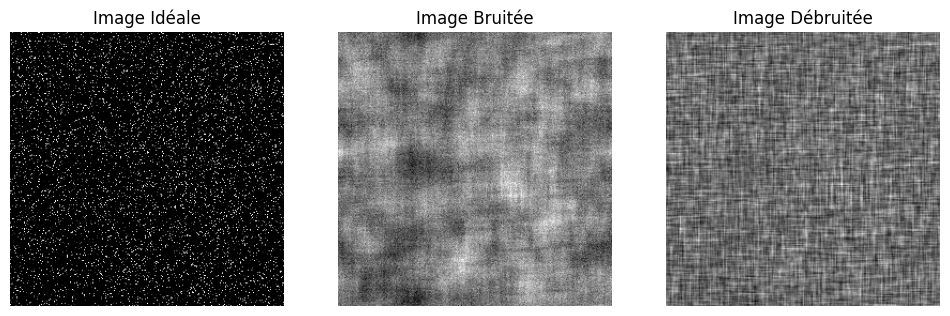

Taille du filtre : 5
SNR: 40 dB
EQM0 :  2.8550720150676465
EQM1 :  0.9300400268185047
PSNR0 :  43.574632936968854
PSNR1 :  48.44578720859859


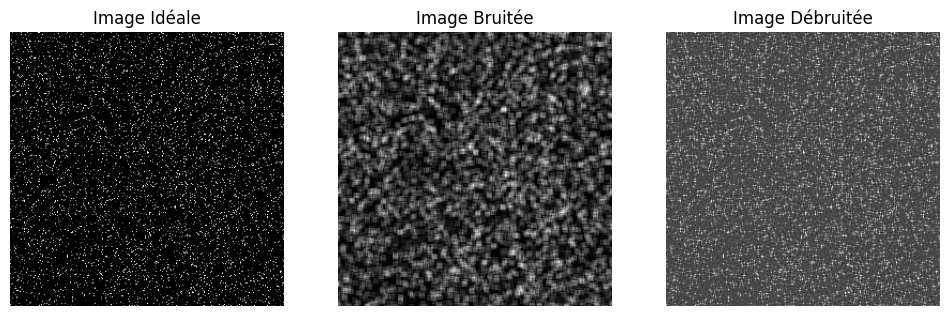

Taille du filtre : 15
SNR: 40 dB
EQM0 :  2.963071557707533
EQM1 :  2.3720793555864153
PSNR0 :  43.41338221118449
PSNR1 :  44.37951147037065


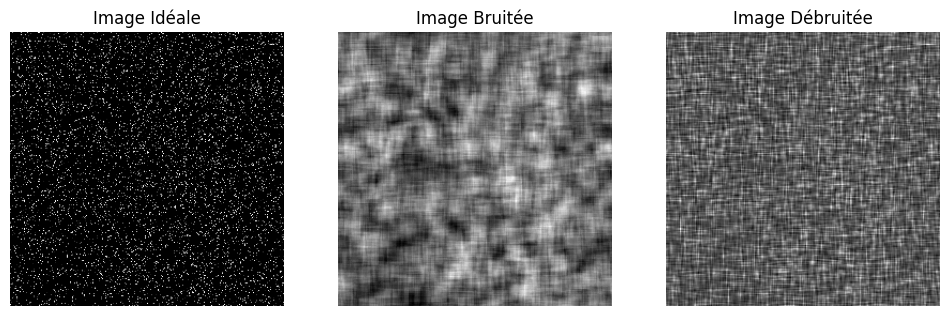

Taille du filtre : 25
SNR: 40 dB
EQM0 :  2.9734825875507562
EQM1 :  2.6953842413335614
PSNR0 :  43.3981496121498
PSNR1 :  43.82459675947772


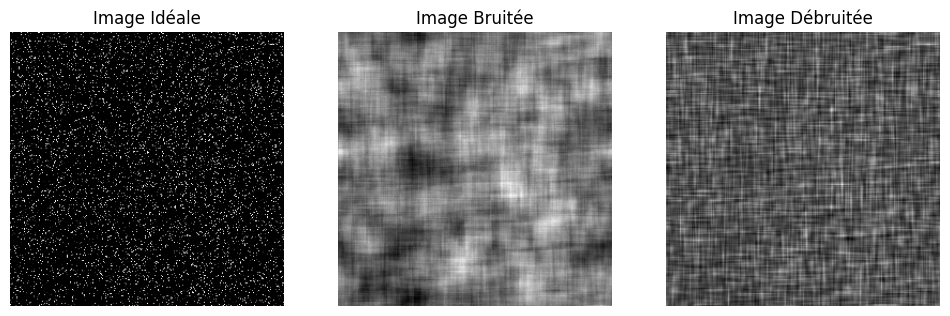

Taille du filtre : 5
SNR: 60 dB
EQM0 :  2.8549802030158635
EQM1 :  0.9262675346854327
PSNR0 :  43.574772597574196
PSNR1 :  48.46343918401395


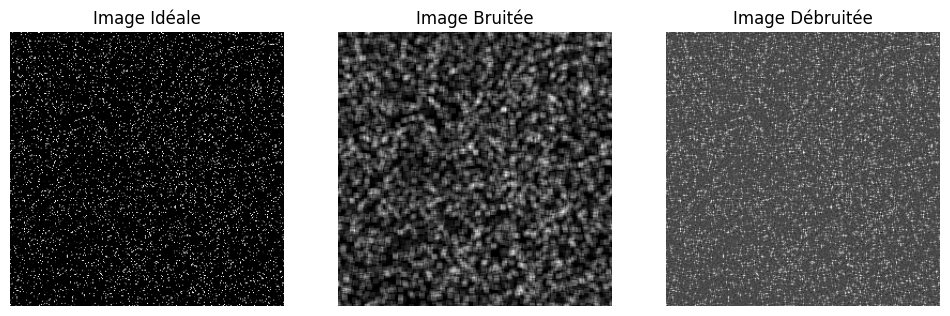

Taille du filtre : 15
SNR: 60 dB
EQM0 :  2.963180097301948
EQM1 :  2.371154602979542
PSNR0 :  43.41322312868286
PSNR1 :  44.38120489288739


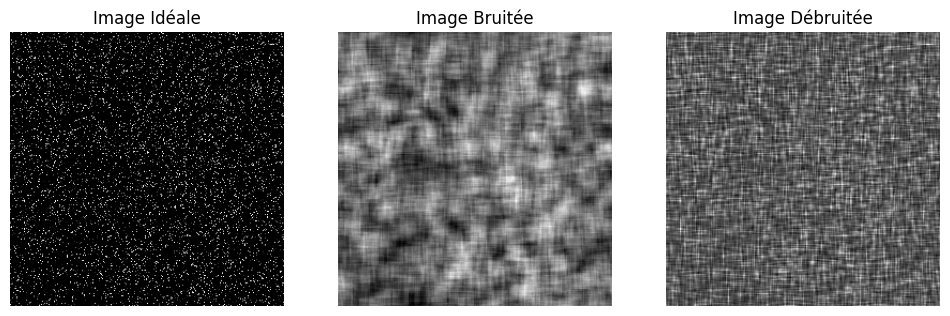

Taille du filtre : 25
SNR: 60 dB
EQM0 :  2.973496586992198
EQM1 :  2.6944990339358874
PSNR0 :  43.39812916519685
PSNR1 :  43.826023286443046


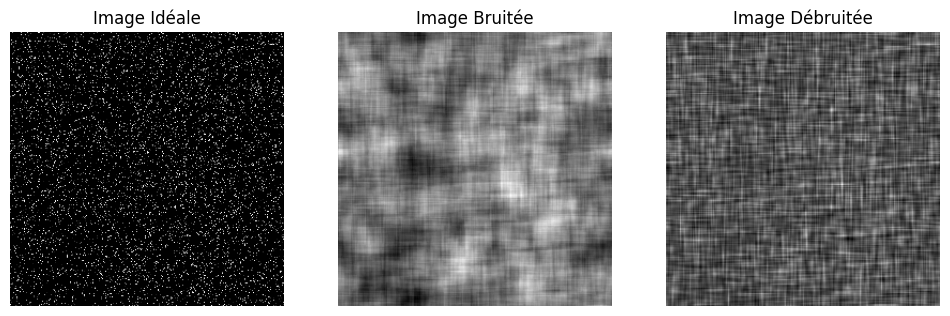

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

images = [img, image_constante, image_sparse]

filter_sizes = [5, 15, 25] 
SNR_values = [20, 40, 60] 

for i_ideal in images:
    taille_image = i_ideal.shape

    for SNRdb in SNR_values:
        for filter_size in filter_sizes:
            h = np.ones((filter_size, filter_size)) / (filter_size * filter_size)

            H = np.zeros_like(i_ideal)
            H[:h.shape[0], :h.shape[1]] = h
            H = np.roll(H, -int(h.shape[0] / 2.0), axis=0)
            H = np.roll(H, -int(h.shape[1] / 2.0), axis=1)

            D = np.fft.fft2(H)
            DT = np.conj(D)
            
            my_conv = np.real(np.fft.ifft2(D * np.fft.fft2(i_ideal)))

            SNR = (10 ** (SNRdb / 10))
            ps_in = np.sum(np.sum(my_conv ** 2)) / (my_conv.shape[0] * my_conv.shape[1])
            pb_norm = ps_in / SNR
            Mnoise = np.sqrt(pb_norm) * np.random.randn(my_conv.shape[0], my_conv.shape[1])
            MCB = my_conv + Mnoise

            alpha_regularisation = 0.001
            i_ideal_est = np.real(np.fft.ifft2(1 / (DT * D + alpha_regularisation) * DT * np.fft.fft2(MCB)))

            EQM0 = np.mean(np.square(MCB - i_ideal))
            EQM1 = np.mean(np.square(i_ideal_est - i_ideal))

            PSNR0 = 20 * np.log10(255.0 / np.sqrt(EQM0))
            PSNR1 = 20 * np.log10(255.0 / np.sqrt(EQM1))

            print(f"Taille du filtre : {filter_size}")
            print(f"SNR: {SNRdb} dB")
            print("EQM0 : ", EQM0)
            print("EQM1 : ", EQM1)
            print("PSNR0 : ", PSNR0)
            print("PSNR1 : ", PSNR1)

            col = 3
            plt.figure(figsize=(12, 16))
            plt.subplot(1, col, 1)
            plt.title("Image Idéale")
            plt.imshow(i_ideal, cmap='gray')
            plt.axis('off')

            plt.subplot(1, col, 2)
            plt.title("Image Bruitée")
            plt.imshow(MCB, cmap='gray')
            plt.axis('off')

            plt.subplot(1, col, 3)
            plt.title("Image Débruitée")
            plt.imshow(i_ideal_est, cmap='gray')
            plt.axis('off')

            plt.show()


6. Idem que la question 2.) avec une norme L1 et TV (Total Variation) par ADMM.

In [ ]:
import numpy as np

def soft_thresholding(x, threshold):
    return np.sign(x) * np.maximum(np.abs(x) - threshold, 0)

def ADMM_L1_TV(y, H, mu, rho, tol=1e-2, max_iter=100):
    x = y.copy()
    z = np.zeros_like(y)
    u = np.zeros_like(y)

    F_H = np.fft.fft2(H)
    F_H_conj = np.conj(F_H)

    dx = np.fft.fftshift(np.fft.fftfreq(y.shape[0]))
    dy = np.fft.fftshift(np.fft.fftfreq(y.shape[1]))
    Dx, Dy = np.meshgrid(dx, dy, indexing='ij')
    F_grad_x = 1j * 2 * np.pi * Dx
    F_grad_y = 1j * 2 * np.pi * Dy

    for k in range(max_iter):
        A = mu * np.abs(F_H)**2 + rho * (np.abs(F_grad_x)**2 + np.abs(F_grad_y)**2)
        B = mu * F_H_conj * np.fft.fft2(y) + np.conj(F_grad_x) * np.fft.fft2(rho * z + u) + np.conj(F_grad_y) * np.fft.fft2(rho * z + u)
        x_new = np.fft.ifft2(B / A).real

        grad_x_new = np.fft.ifft2(F_grad_x * np.fft.fft2(x_new)).real
        grad_y_new = np.fft.ifft2(F_grad_y * np.fft.fft2(x_new)).real
        grad_new = grad_x_new + grad_y_new

        z_new = soft_thresholding(grad_new - u / rho, 1 / rho)

        u_new = u + rho * (z_new - grad_new)

        print(f"Iteration {k+1} / {max_iter}")
        print(f"Norme de la différence entre x et x_new: {np.linalg.norm(x - x_new)}")

        if np.linalg.norm(x - x_new) / np.linalg.norm(x) < tol:
            break

        x, z, u = x_new, z_new, u_new

    return x

In [ ]:
# import numpy as np
# import matplotlib.pyplot as plt
# from sklearn.metrics import mean_absolute_error, mean_squared_error
# from skimage.metrics import peak_signal_noise_ratio as psnr

# mu_values = np.linspace(1e-4, 1, 10)
# rho_values = np.linspace(1e-4, 1, 10)

# images = [img, image_constante, image_sparse]
# h = np.ones((15, 15)) / (15.0 * 15.0)

# for i_ideal in images:
#     taille_image = i_ideal.shape

#     H = np.zeros_like(i_ideal)
#     H[:h.shape[0], :h.shape[1]] = h
#     H = np.roll(H, -int(h.shape[0] / 2.0), axis=0)
#     H = np.roll(H, -int(h.shape[1] / 2.0), axis=1)

#     my_conv = np.real(np.fft.ifft2(np.fft.fft2(H) * np.fft.fft2(i_ideal)))

#     SNRdb = 40
#     SNR = (10 ** (SNRdb / 10))
#     ps_in = np.sum(np.sum(my_conv ** 2)) / (i_ideal.shape[0] * i_ideal.shape[1])
#     pb_norm = ps_in / SNR
#     Mnoise = np.sqrt(pb_norm) * np.random.randn(i_ideal.shape[0], i_ideal.shape[1])
#     MCB = my_conv + Mnoise

#     mse_scores = np.zeros((len(mu_values), len(rho_values)))
#     mae_scores = np.zeros((len(mu_values), len(rho_values)))
#     psnr_scores = np.zeros((len(mu_values), len(rho_values)))

#     for i, mu in enumerate(mu_values):
#         for j, rho in enumerate(rho_values):
#             restored_image = ADMM_L1_TV(MCB, H, mu, rho)
            
#             mse_scores[i, j] = mean_squared_error(i_ideal, restored_image)
#             mae_scores[i, j] = mean_absolute_error(i_ideal, restored_image)
#             psnr_scores[i, j] = psnr(i_ideal, restored_image)

#     def plot_3d_surface(X, Y, Z, title):
#         fig = plt.figure(figsize=(8, 6))
#         ax = fig.add_subplot(111, projection='3d')
#         X, Y = np.meshgrid(X, Y)
#         ax.plot_surface(X, Y, Z.T, cmap='viridis')
#         ax.set_xlabel('Mu')
#         ax.set_ylabel('Rho')
#         ax.set_zlabel(title)
#         ax.set_title(title)
#         plt.show()

#     plot_3d_surface(mu_values, rho_values, mse_scores, 'MSE')
#     plot_3d_surface(mu_values, rho_values, mae_scores, 'MAE')
#     plot_3d_surface(mu_values, rho_values, psnr_scores, 'PSNR')


Dimensions de MCB: (600, 800), Dimensions de H: (600, 800)
Iteration 1 / 100
Norme de la différence entre x et x_new: 364.7274248632938
Iteration 2 / 100
Norme de la différence entre x et x_new: 243.0956727791148
Iteration 3 / 100
Norme de la différence entre x et x_new: 109.9542059726559
Iteration 4 / 100
Norme de la différence entre x et x_new: 73.05247562499045
Iteration 5 / 100
Norme de la différence entre x et x_new: 55.1184090549818
Iteration 6 / 100
Norme de la différence entre x et x_new: 44.395498945253145
Iteration 7 / 100
Norme de la différence entre x et x_new: 37.23027596588003
Iteration 8 / 100
Norme de la différence entre x et x_new: 32.093785881087285
Iteration 9 / 100
Norme de la différence entre x et x_new: 28.22684441983063
Iteration 10 / 100
Norme de la différence entre x et x_new: 25.207777117859862
Iteration 11 / 100
Norme de la différence entre x et x_new: 22.78316795155151
Iteration 12 / 100
Norme de la différence entre x et x_new: 20.791549642199083
Iteration 1

C:\Users\norph\AppData\Local\Temp\ipykernel_18872\3101974371.py:4: RuntimeWarning: divide by zero encountered in log
  magnitude_spectrum = 20 * np.log(np.abs(fshift))


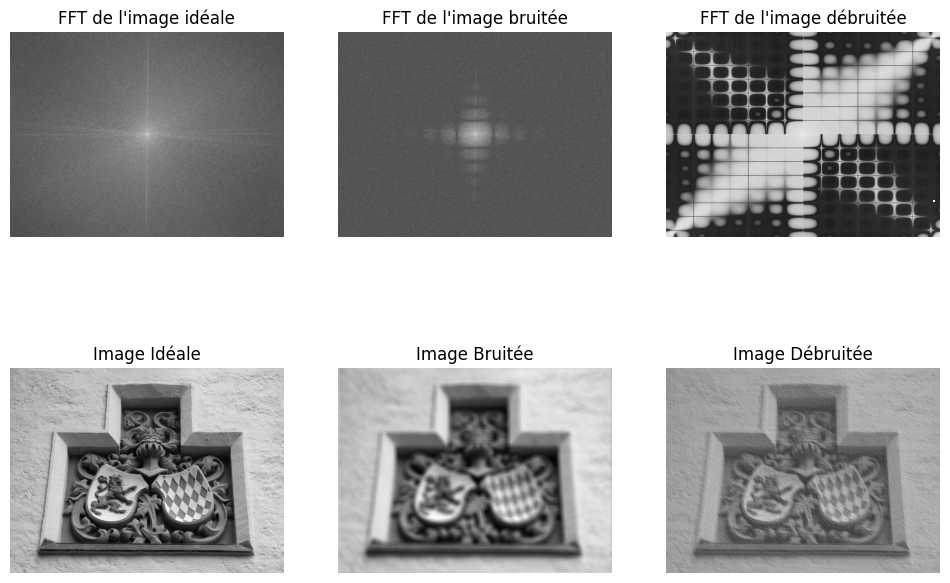

Dimensions de MCB: (256, 256), Dimensions de H: (256, 256)
Iteration 1 / 100
Norme de la différence entre x et x_new: 558.2886476934248
Iteration 2 / 100
Norme de la différence entre x et x_new: 375.0940743776364
Iteration 3 / 100
Norme de la différence entre x et x_new: 168.70362574848167
Iteration 4 / 100
Norme de la différence entre x et x_new: 114.22151333432647
Iteration 5 / 100
Norme de la différence entre x et x_new: 87.64777378552012
Iteration 6 / 100
Norme de la différence entre x et x_new: 71.42251665877986
Iteration 7 / 100
Norme de la différence entre x et x_new: 60.32778941838428
Iteration 8 / 100
Norme de la différence entre x et x_new: 52.21883621134175
Iteration 9 / 100
Norme de la différence entre x et x_new: 46.0253344944305
Iteration 10 / 100
Norme de la différence entre x et x_new: 41.142719378917946
Iteration 11 / 100
Norme de la différence entre x et x_new: 37.19934951259218
Iteration 12 / 100
Norme de la différence entre x et x_new: 33.95233223937153
Iteration 13

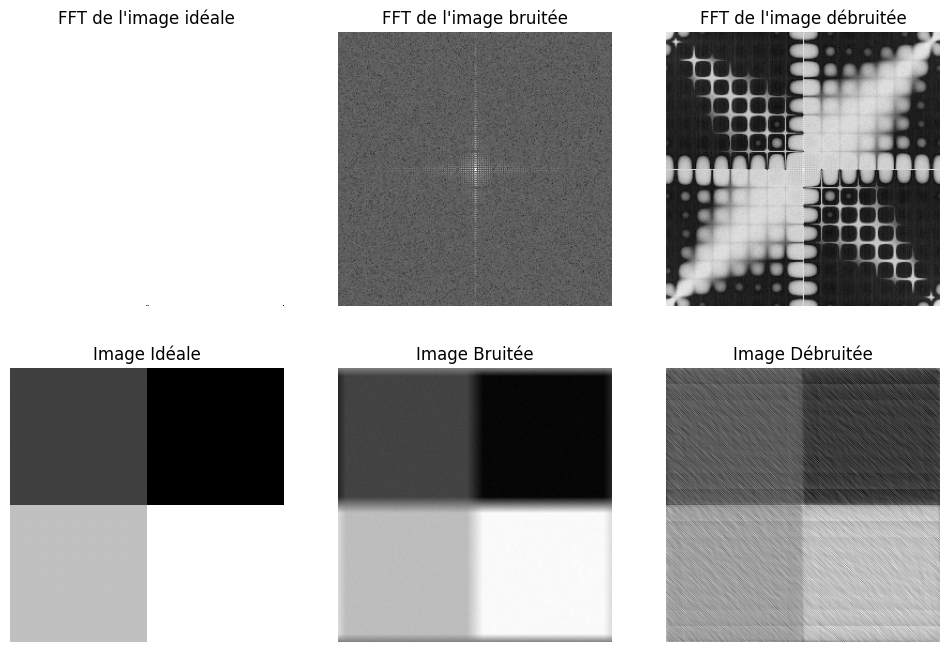

Dimensions de MCB: (256, 256), Dimensions de H: (256, 256)
Iteration 1 / 100
Norme de la différence entre x et x_new: 258.3939622694578
Iteration 2 / 100
Norme de la différence entre x et x_new: 118.10182254393807
Iteration 3 / 100
Norme de la différence entre x et x_new: 49.14783750338068
Iteration 4 / 100
Norme de la différence entre x et x_new: 31.30197192512356
Iteration 5 / 100
Norme de la différence entre x et x_new: 23.025716019571075
Iteration 6 / 100
Norme de la différence entre x et x_new: 18.267450915765938
Iteration 7 / 100
Norme de la différence entre x et x_new: 15.194821304939222
Iteration 8 / 100
Norme de la différence entre x et x_new: 13.054037775341222
Iteration 9 / 100
Norme de la différence entre x et x_new: 11.477628713779882
Iteration 10 / 100
Norme de la différence entre x et x_new: 10.2662565994994
Iteration 11 / 100
Norme de la différence entre x et x_new: 9.303480524950851
Iteration 12 / 100
Norme de la différence entre x et x_new: 8.517362706922533
Iteration

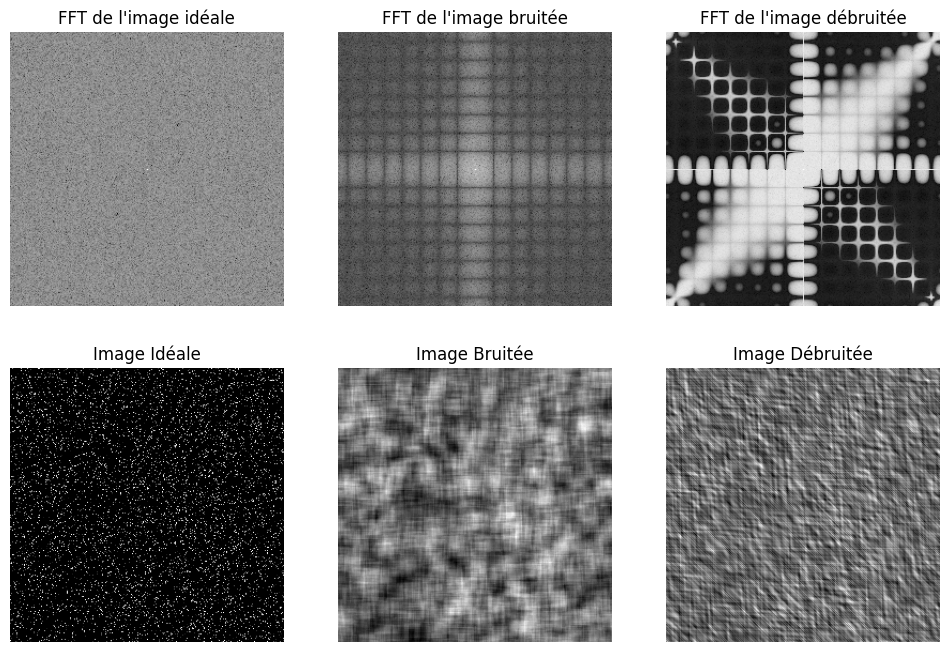

In [ ]:
images = [img, image_constante, image_sparse]
h = np.ones((15, 15)) / (15.0 * 15.0)

for i_ideal in images:
    taille_image = i_ideal.shape

    H = np.zeros_like(i_ideal)
    H[:h.shape[0], :h.shape[1]] = h
    H = np.roll(H, -int(h.shape[0] / 2.0), axis=0)
    H = np.roll(H, -int(h.shape[1] / 2.0), axis=1)

    my_conv = np.real(np.fft.ifft2(np.fft.fft2(H) * np.fft.fft2(i_ideal)))

    SNRdb = 40
    SNR = (10 ** (SNRdb / 10))
    ps_in = np.sum(np.sum(my_conv ** 2)) / (i_ideal.shape[0] * i_ideal.shape[1])
    pb_norm = ps_in / SNR
    Mnoise = np.sqrt(pb_norm) * np.random.randn(i_ideal.shape[0], i_ideal.shape[1])
    MCB = my_conv + Mnoise

    print(f"Dimensions de MCB: {MCB.shape}, Dimensions de H: {H.shape}")

    i_ideal_est = ADMM_L1_TV(MCB, H, mu=1, rho=0.00001, tol=0.0001, max_iter=100)

    EQM0 = np.mean(np.square(MCB - i_ideal))
    EQM1 = np.mean(np.square(i_ideal_est - i_ideal))

    print("EQM0 : ", EQM0)
    print("EQM1 : ", EQM1)

    PSNR0 = 20 * np.log10(255.0 / np.sqrt(EQM0))
    PSNR1 = 20 * np.log10(255.0 / np.sqrt(EQM1))

    print("PSNR0 : ", PSNR0)
    print("PSNR1 : ", PSNR1)

    col = 3
    plt.figure(figsize=(12, 16))
    plt.subplot(1, col, 1)
    plt.title("Image Idéale")
    plt.imshow(i_ideal, cmap='gray')
    plt.axis('off')

    plt.subplot(1, col, 2)
    plt.title("Image Bruitée")
    plt.imshow(MCB, cmap='gray')
    plt.axis('off')

    plt.subplot(1, col, 3)
    plt.title("Image Débruitée")
    plt.imshow(i_ideal_est, cmap='gray')
    plt.axis('off')

    plt.subplot(2, col, 1)
    plt.title("FFT de l'image idéale")
    plt.imshow(show_fft(i_ideal), cmap='gray')
    plt.axis('off')

    plt.subplot(2, col, 2)
    plt.title("FFT de l'image bruitée")
    plt.imshow(show_fft(MCB), cmap='gray')
    plt.axis('off')

    plt.subplot(2, col, 3)
    plt.title("FFT de l'image débruitée")
    plt.imshow(show_fft(i_ideal_est), cmap='gray')
    plt.axis('off')

    plt.show()